In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage
import plotly.figure_factory as ff



#### Train Test Split

In [2]:
mma_mart = pd.read_csv('mma_mart.csv')

In [3]:
mma_mart.head(10)

,order_id,product_id,product_name,aisle_id,aisle,department_id,department
0,1,49302,Bulgarian Yogurt,120,yogurt,16,dairy eggs
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,other creams cheeses,16,dairy eggs
2,1,10246,Organic Celery Hearts,83,fresh vegetables,4,produce
3,1,49683,Cucumber Kirby,83,fresh vegetables,4,produce
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,canned meat seafood,15,canned goods
5,1,13176,Bag of Organic Bananas,24,fresh fruits,4,produce
6,1,47209,Organic Hass Avocado,24,fresh fruits,4,produce
7,1,22035,Organic Whole String Cheese,21,packaged cheese,16,dairy eggs
8,2,33120,Organic Egg Whites,86,eggs,16,dairy eggs
9,2,28985,Michigan Organic Kale,83,fresh vegetables,4,produce


In [4]:
mma_mart.shape

(987259, 7)

In [5]:
mma_mart.nunique()

order_id         97833
product_id       35070
product_name     35070
aisle_id           134
aisle              134
department_id       21
department          21
dtype: int64

In [6]:
mma_mart.describe()

,order_id,product_id,aisle_id,department_id
count,987259.000000,987259.000000,987259.000000,987259.000000
mean,50018.074081,25575.839196,71.207365,9.919778
std,28916.254672,14100.318531,38.185998,6.284092
min,1.000000,1.000000,1.000000,1.000000
25%,24932.000000,13500.000000,31.000000,4.000000
50%,50016.000000,25256.000000,83.000000,9.000000
75%,75003.000000,37917.000000,107.000000,16.000000
max,100000.000000,49688.000000,134.000000,21.000000


In [7]:
mma_mart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 987259 entries, 0 to 987258
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   order_id       987259 non-null  int64 
 1   product_id     987259 non-null  int64 
 2   product_name   987259 non-null  object
 3   aisle_id       987259 non-null  int64 
 4   aisle          987259 non-null  object
 5   department_id  987259 non-null  int64 
 6   department     987259 non-null  object
dtypes: int64(4), object(3)
memory usage: 52.7+ MB


In [8]:
mma_mart.isnull()

,order_id,product_id,product_name,aisle_id,aisle,department_id,department
0,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...
987254,False,False,False,False,False,False,False
987255,False,False,False,False,False,False,False
987256,False,False,False,False,False,False,False
987257,False,False,False,False,False,False,False


In [9]:
# Sort the DataFrame by order_id to ensure data within the same order_id is together
mma_mart = mma_mart.sort_values(by='order_id')

In [10]:
# Identify unique order IDs
unique_order_ids = mma_mart['order_id'].unique()

# Split the unique order IDs into training and testing sets
train_order_ids, test_order_ids = train_test_split(unique_order_ids, test_size=0.2, random_state=42)

# Create the training set by selecting rows with order IDs in train_order_ids
train_set = mma_mart[mma_mart['order_id'].isin(train_order_ids)]

# Create the test set by selecting rows with order IDs in test_order_ids
test_set = mma_mart[mma_mart['order_id'].isin(test_order_ids)]

In [11]:
train_set.shape

(790099, 7)

In [12]:
test_set.shape

(197160, 7)

#### EDA


In [13]:
df=train_set

In [14]:
df.head(10)

,order_id,product_id,product_name,aisle_id,aisle,department_id,department
0,1,49302,Bulgarian Yogurt,120,yogurt,16,dairy eggs
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,other creams cheeses,16,dairy eggs
2,1,10246,Organic Celery Hearts,83,fresh vegetables,4,produce
3,1,49683,Cucumber Kirby,83,fresh vegetables,4,produce
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,canned meat seafood,15,canned goods
5,1,13176,Bag of Organic Bananas,24,fresh fruits,4,produce
6,1,47209,Organic Hass Avocado,24,fresh fruits,4,produce
7,1,22035,Organic Whole String Cheese,21,packaged cheese,16,dairy eggs
16,2,43668,Classic Blend Cole Slaw,123,packaged vegetables fruits,4,produce
15,2,1819,All Natural No Stir Creamy Almond Butter,88,spreads,13,pantry


In [15]:
# Group by department and product_id, and calculate the count of unique order_ids
department_product_sales = train_set.groupby(['department', 'product_id'])['order_id'].nunique().reset_index()

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


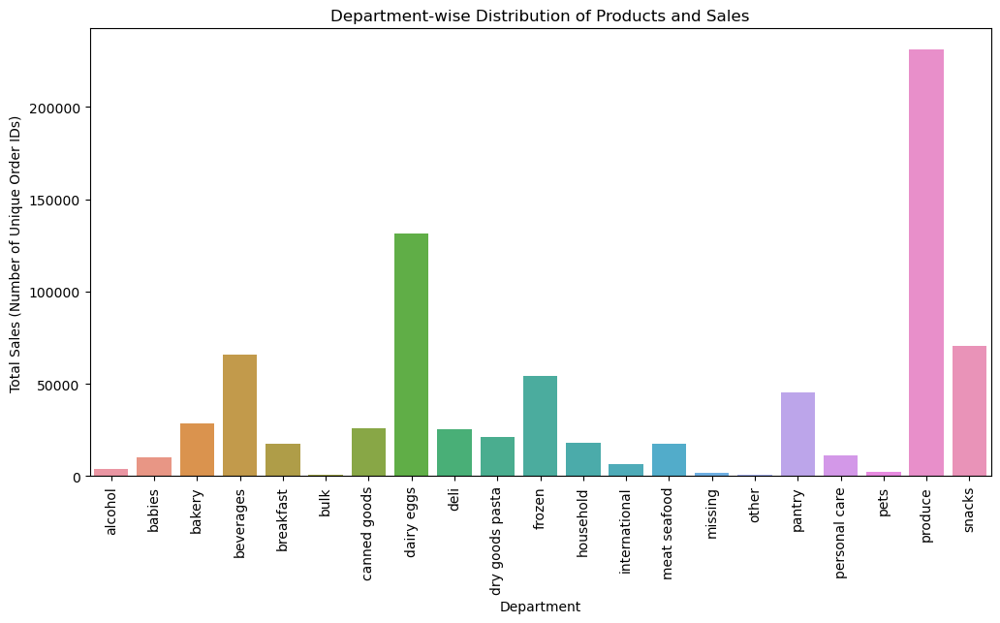

In [16]:
# Group by department and calculate the total sales (sum of unique order_ids)
department_sales = department_product_sales.groupby('department')['order_id'].sum().reset_index()

# Create a bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='department', y='order_id', data=department_sales)
plt.title('Department-wise Distribution of Products and Sales')
plt.xticks(rotation=90)
plt.xlabel('Department')
plt.ylabel('Total Sales (Number of Unique Order IDs)')
plt.show()

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

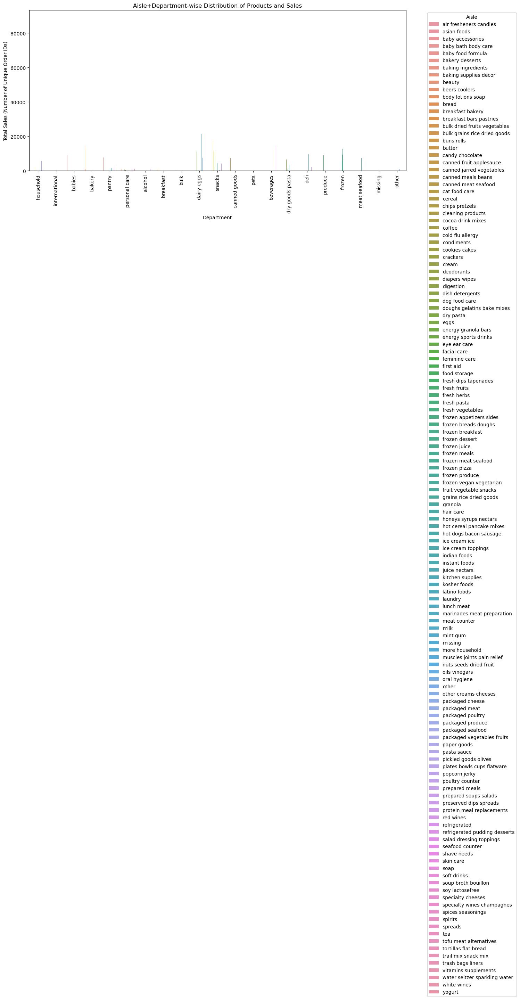

In [17]:
# Group by aisle, department, and product_id, and calculate the count of unique order_ids
aisle_department_product_sales = train_set.groupby(['aisle', 'department', 'product_id'])['order_id'].nunique().reset_index()

# Group by aisle and department, and calculate the total sales (sum of unique order_ids)
aisle_department_sales = aisle_department_product_sales.groupby(['aisle', 'department'])['order_id'].sum().reset_index()

# Create a bar chart
plt.figure(figsize=(14, 6))
sns.barplot(x='department', y='order_id', hue='aisle', data=aisle_department_sales)
plt.title('Aisle+Department-wise Distribution of Products and Sales')
plt.xticks(rotation=90)
plt.xlabel('Department')
plt.ylabel('Total Sales (Number of Unique Order IDs)')
plt.legend(title='Aisle', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


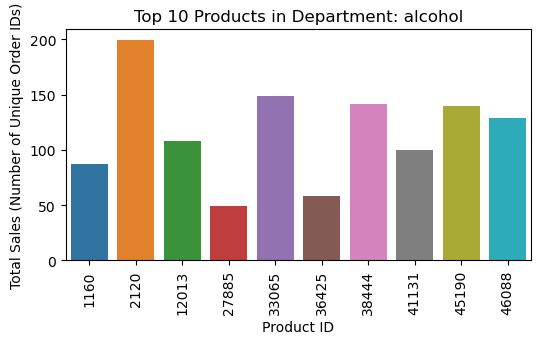

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


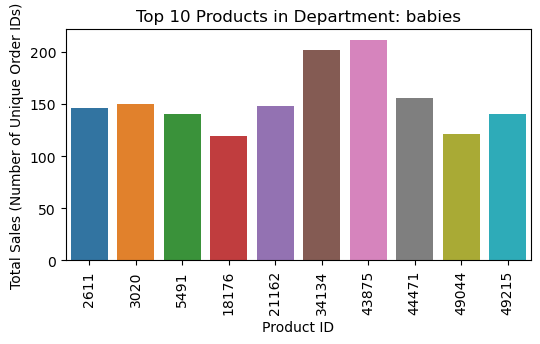

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


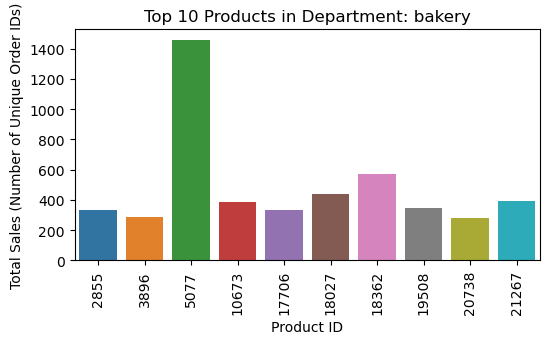

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


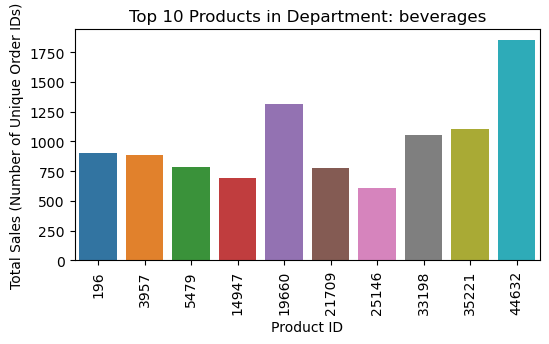

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


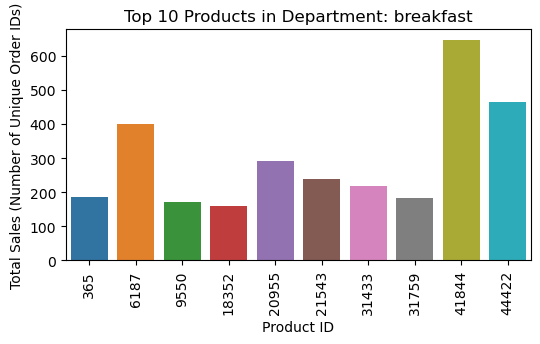

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


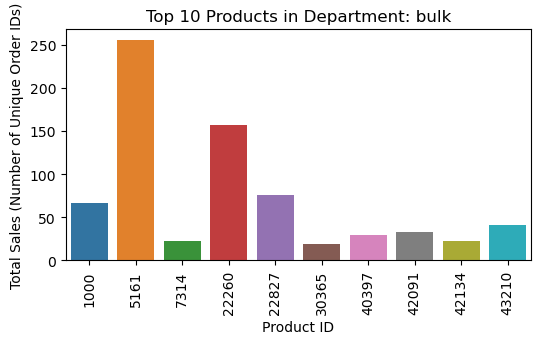

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


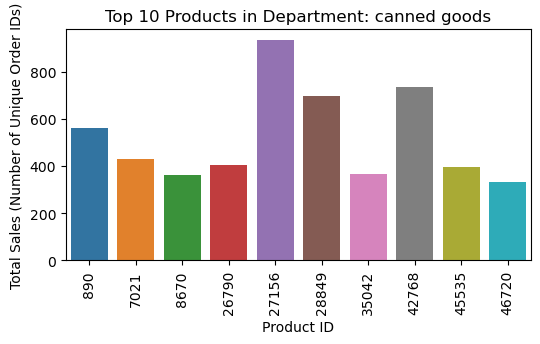

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


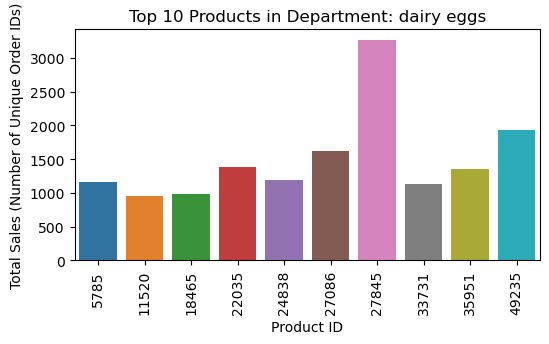

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


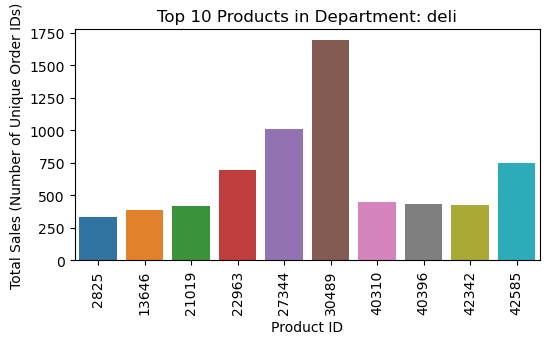

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


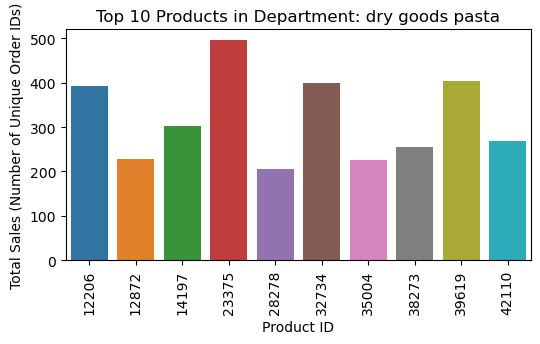

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


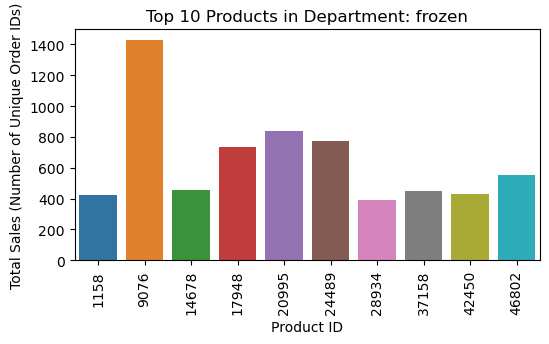

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


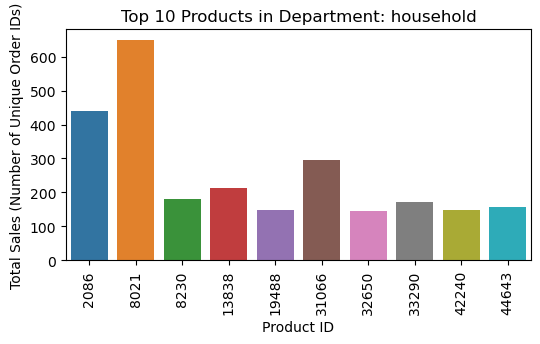

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


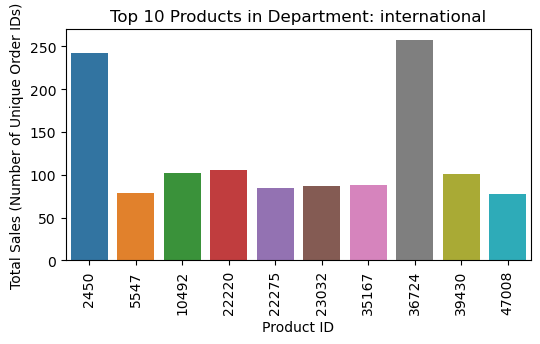

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


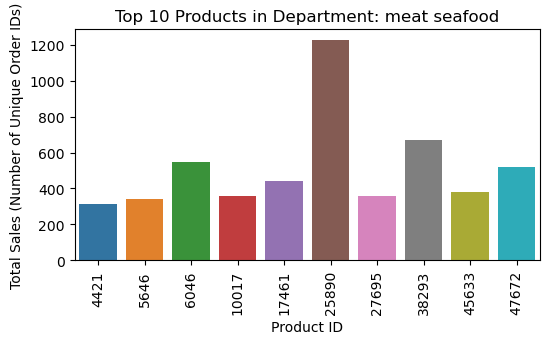

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


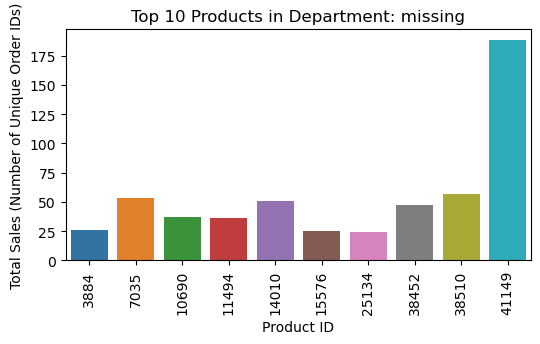

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


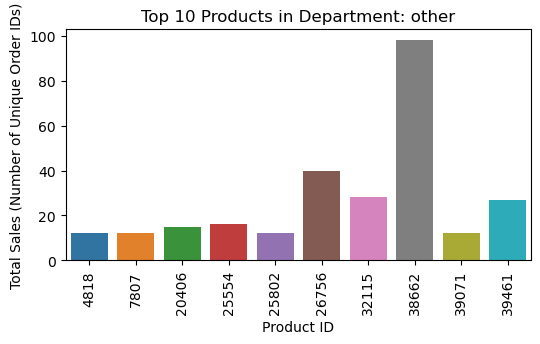

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


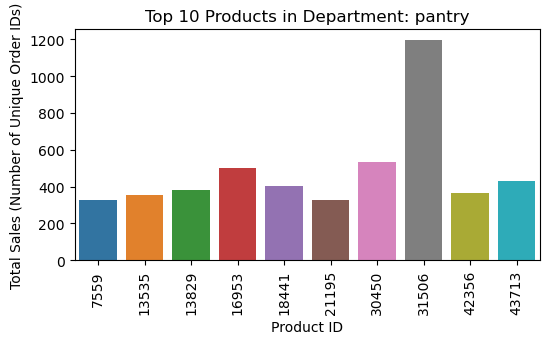

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


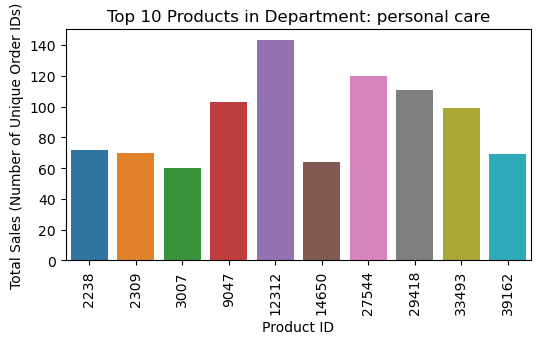

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


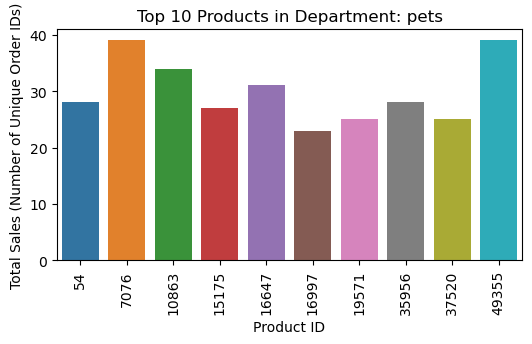

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


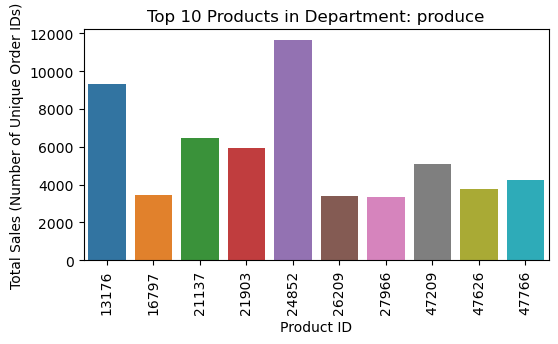

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


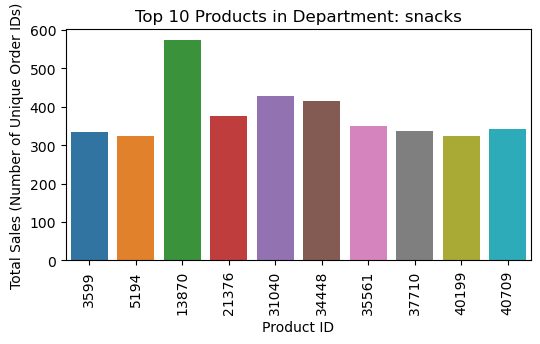

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by department and product_id, and calculate the count of unique order_ids
department_product_sales = train_set.groupby(['department', 'product_id'])['order_id'].nunique().reset_index()

# List of unique departments
unique_departments = department_product_sales['department'].unique()

# Create individual bar charts for each department
for department in unique_departments:
    # Filter data for the current department
    department_data = department_product_sales[department_product_sales['department'] == department]
    
    # Sort data by sales (order_ids) in descending order
    department_data = department_data.sort_values(by='order_id', ascending=False)
    
    # Create a bar chart
    plt.figure(figsize=(6, 3))
    sns.barplot(x='product_id', y='order_id', data=department_data.head(10))
    plt.title(f'Top 10 Products in Department: {department}')
    plt.xticks(rotation=90)
    plt.xlabel('Product ID')
    plt.ylabel('Total Sales (Number of Unique Order IDs)')
    plt.show()


C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

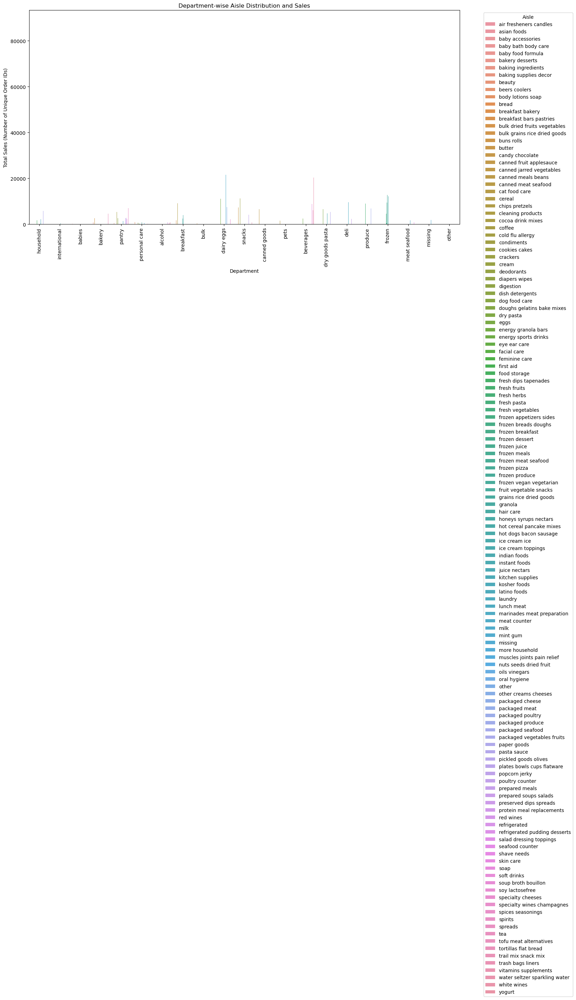

In [19]:
# Group by aisle, department, and product_id, and calculate the count of unique order_ids
aisle_department_product_sales = train_set.groupby(['aisle', 'department', 'product_id'])['order_id'].nunique().reset_index()

# Group by aisle and department, and calculate the total sales (sum of unique order_ids)
aisle_department_sales = aisle_department_product_sales.groupby(['aisle', 'department'])['order_id'].sum().reset_index()

# Create a grouped bar chart
plt.figure(figsize=(16, 8))
sns.barplot(x='department', y='order_id', hue='aisle', data=aisle_department_sales)
plt.title('Department-wise Aisle Distribution and Sales')
plt.xticks(rotation=90)
plt.xlabel('Department')
plt.ylabel('Total Sales (Number of Unique Order IDs)')
plt.legend(title='Aisle', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

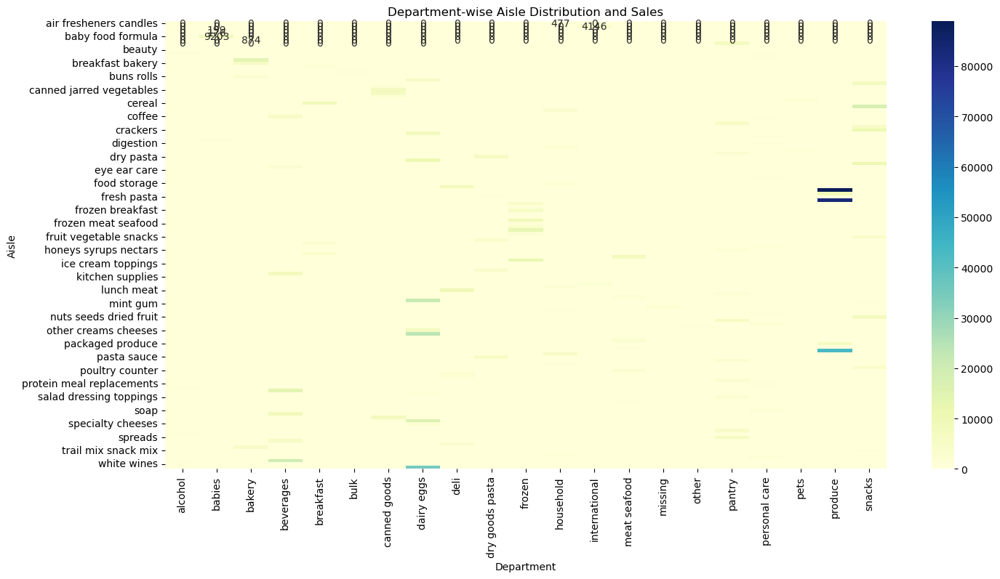

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Group by aisle, department, and product_id, and calculate the count of unique order_ids
aisle_department_product_sales = train_set.groupby(['aisle', 'department', 'product_id'])['order_id'].nunique().reset_index()

# Pivot the data to create a matrix with aisles as rows, departments as columns, and sales as values
heatmap_data = aisle_department_product_sales.pivot_table(index='aisle', columns='department', values='order_id', aggfunc='sum', fill_value=0)

# Create a heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True, annot=True, fmt='g')
plt.title('Department-wise Aisle Distribution and Sales')
plt.xticks(rotation=90)
plt.xlabel('Department')
plt.ylabel('Aisle')
plt.show()


In [21]:
# Pivot the data to create a matrix with aisles as rows, departments as columns, and sales as values
sales_matrix = df.pivot_table(index='aisle', columns='department', values='order_id', aggfunc='count', fill_value=0)

In [22]:
sales_matrix

department,alcohol,babies,bakery,beverages,breakfast,bulk,canned goods,dairy eggs,deli,dry goods pasta,...,household,international,meat seafood,missing,other,pantry,personal care,pets,produce,snacks
aisle,,,,,,,,,,,,,,,,,,,,,
air fresheners candles,0,0,0,0,0,0,0,0,0,0,...,477,0,0,0,0,0,0,0,0,0
asian foods,0,0,0,0,0,0,0,0,0,0,...,0,4146,0,0,0,0,0,0,0,0
baby accessories,0,199,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
baby bath body care,0,176,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
baby food formula,0,9203,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
trash bags liners,0,0,0,0,0,0,0,0,0,0,...,833,0,0,0,0,0,0,0,0,0
vitamins supplements,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1137,0,0,0
water seltzer sparkling water,0,0,0,20420,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
# Perform hierarchical clustering
linkage_matrix = linkage(sales_matrix.values, method='ward')

In [24]:
linkage_matrix

array([[1.14000000e+02, 1.15000000e+02, 4.00000000e+00, 2.00000000e+00],
       [4.70000000e+01, 1.34000000e+02, 1.03923048e+01, 3.00000000e+00],
       [2.00000000e+00, 3.00000000e+00, 2.30000000e+01, 2.00000000e+00],
       [1.01000000e+02, 1.07000000e+02, 2.60000000e+01, 2.00000000e+00],
       [1.00000000e+01, 1.08000000e+02, 2.80000000e+01, 2.00000000e+00],
       [3.70000000e+01, 7.90000000e+01, 3.20000000e+01, 2.00000000e+00],
       [2.90000000e+01, 3.60000000e+01, 3.50000000e+01, 2.00000000e+00],
       [4.40000000e+01, 1.35000000e+02, 3.55176013e+01, 4.00000000e+00],
       [1.40000000e+01, 1.50000000e+01, 4.20000000e+01, 2.00000000e+00],
       [3.40000000e+01, 8.70000000e+01, 4.90000000e+01, 2.00000000e+00],
       [7.30000000e+01, 7.70000000e+01, 6.00000000e+01, 2.00000000e+00],
       [0.00000000e+00, 8.60000000e+01, 6.50000000e+01, 2.00000000e+00],
       [4.50000000e+01, 1.41000000e+02, 6.73565142e+01, 5.00000000e+00],
       [9.00000000e+01, 1.16000000e+02, 8.60000000e

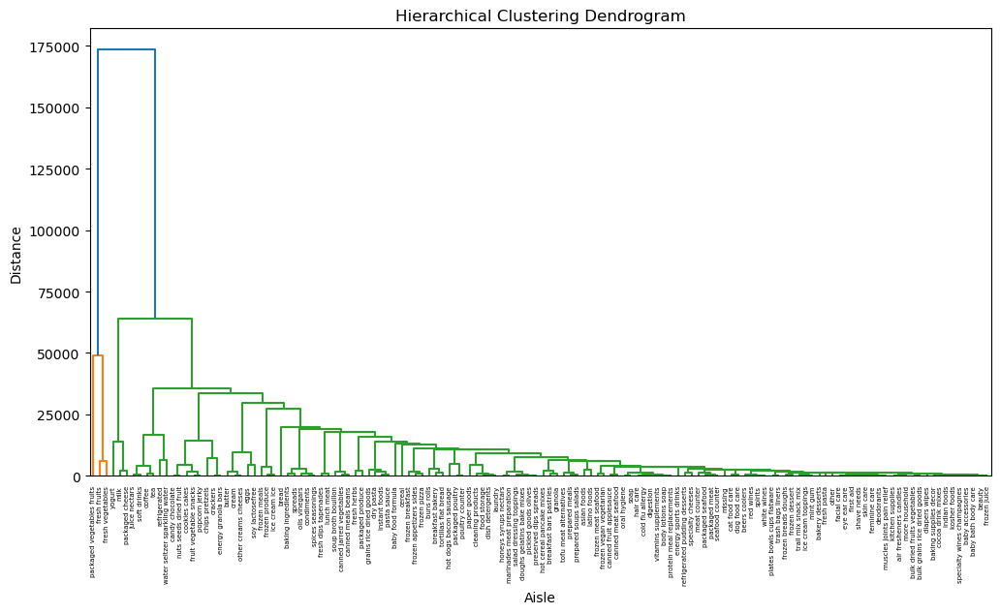

In [25]:
# Create a dendrogram using matplotlib
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, labels=sales_matrix.index, orientation='top')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Aisle')
plt.ylabel('Distance')
plt.xticks(rotation=90)
plt.show()

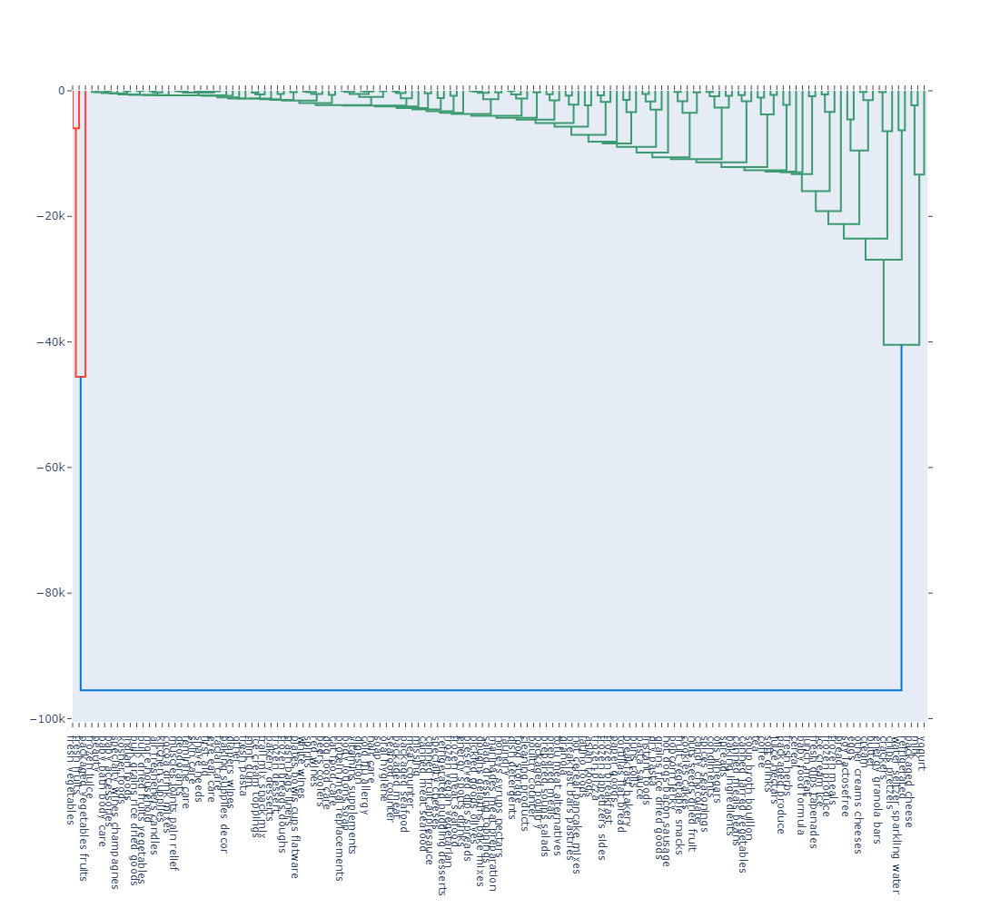

In [26]:
# Create an interactive dendrogram using Plotly
fig = ff.create_dendrogram(sales_matrix.values, orientation='top', labels=sales_matrix.index)
fig.update_layout(width=1000, height=1000)
fig.show()

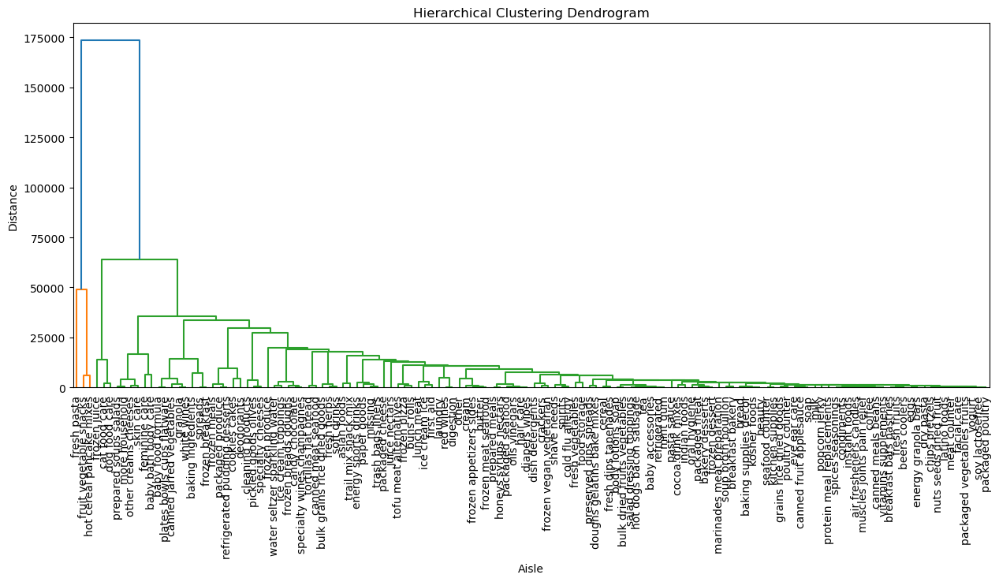

In [27]:
# Sort the aisles based on total sales
sorted_aisles = sales_matrix.sum(axis=1).sort_values(ascending=False).index
sorted_sales_matrix = sales_matrix.loc[sorted_aisles]

# Create a dendrogram using matplotlib
plt.figure(figsize=(15, 6))
dendrogram(linkage_matrix, labels=sorted_aisles, orientation='top', leaf_font_size=10)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Aisle')
plt.ylabel('Distance')
plt.xticks(rotation=90)
plt.show()

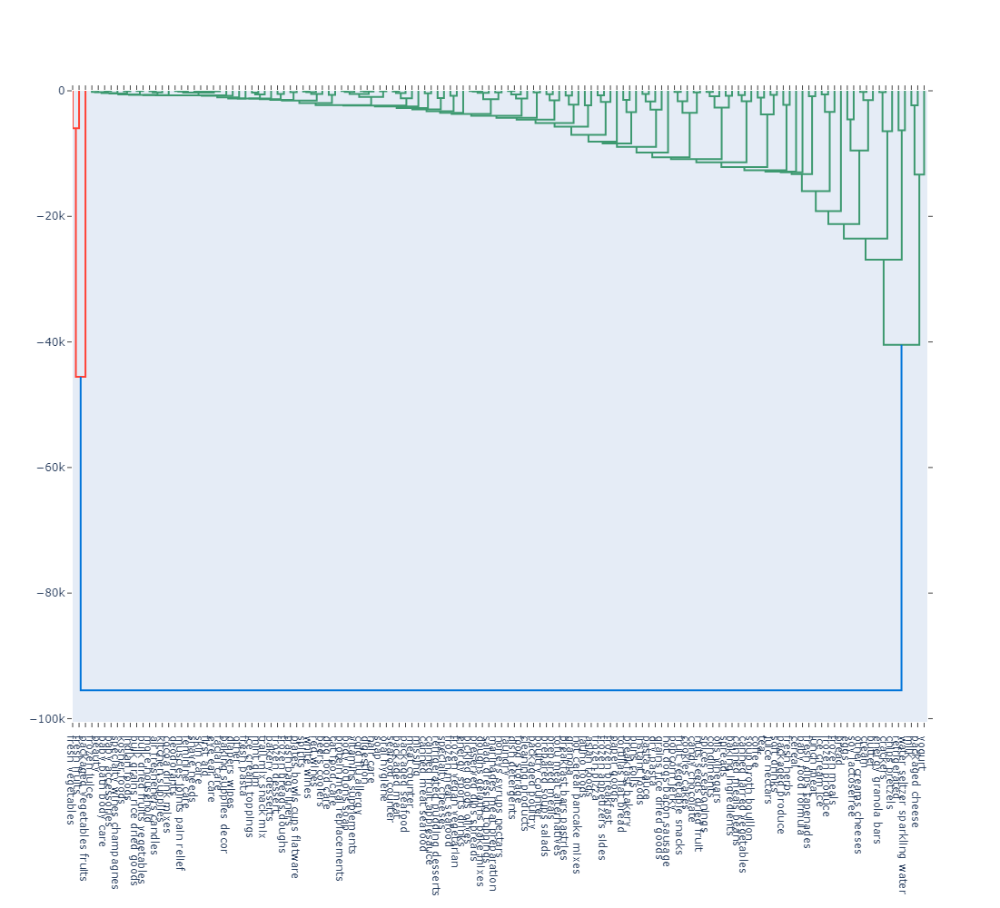

In [28]:
# Create an interactive dendrogram using Plotly
fig = ff.create_dendrogram(sorted_sales_matrix.values, orientation='top', labels=sorted_aisles)
fig.update_layout(width=1000, height=1000)
fig.show()

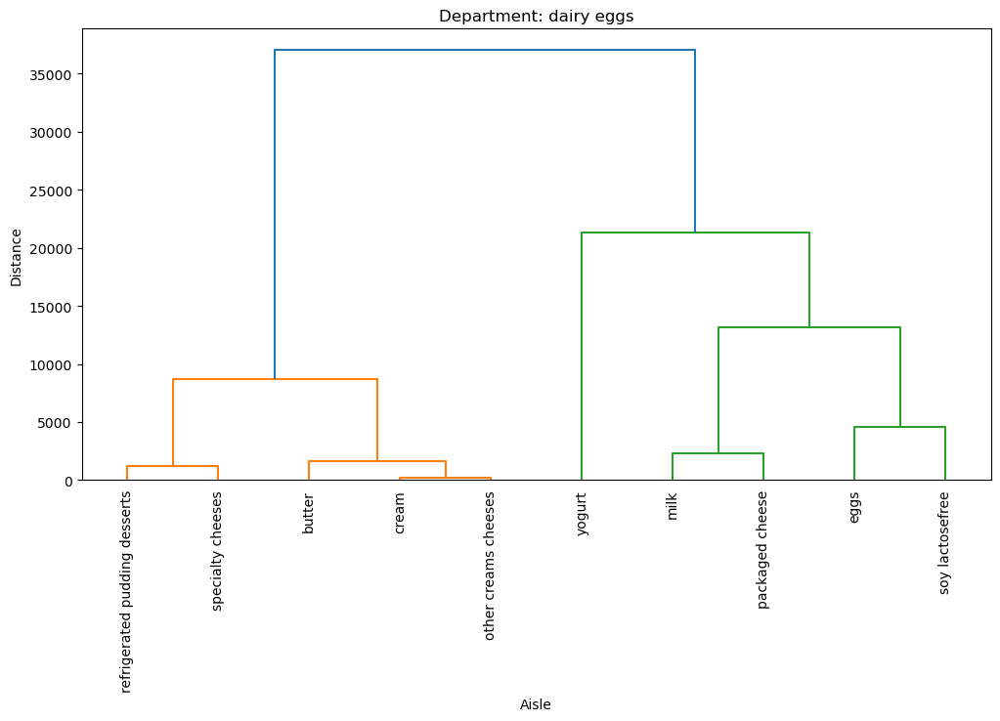

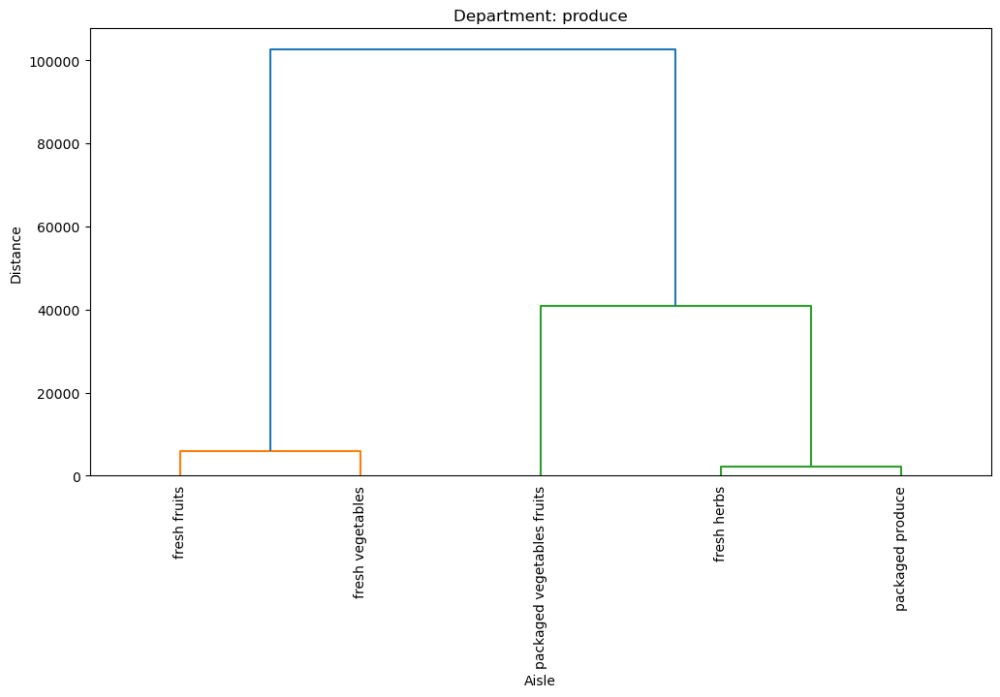

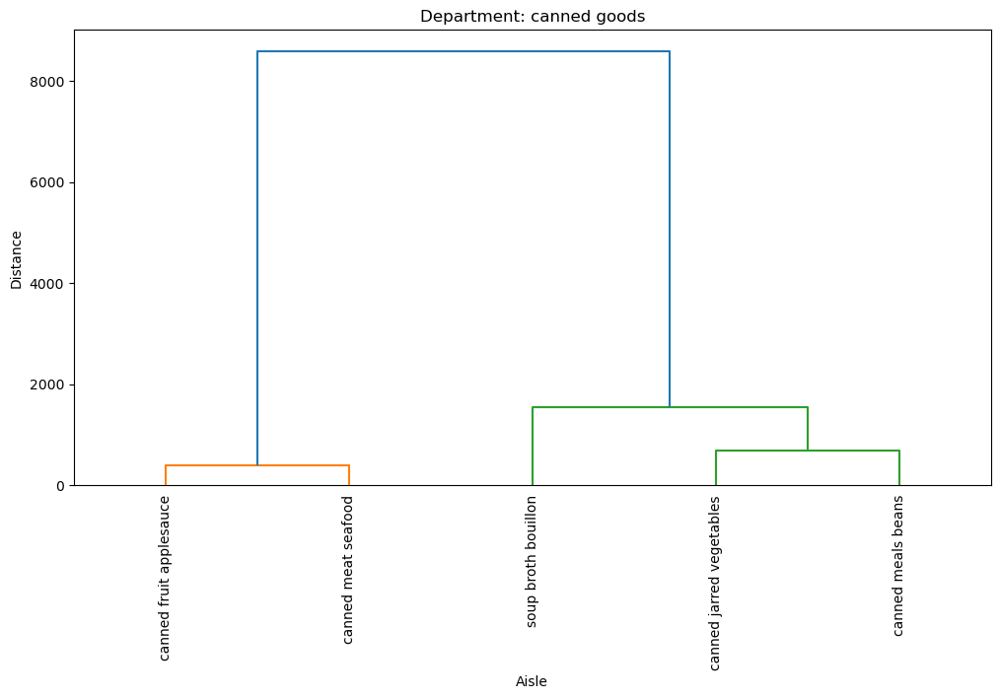

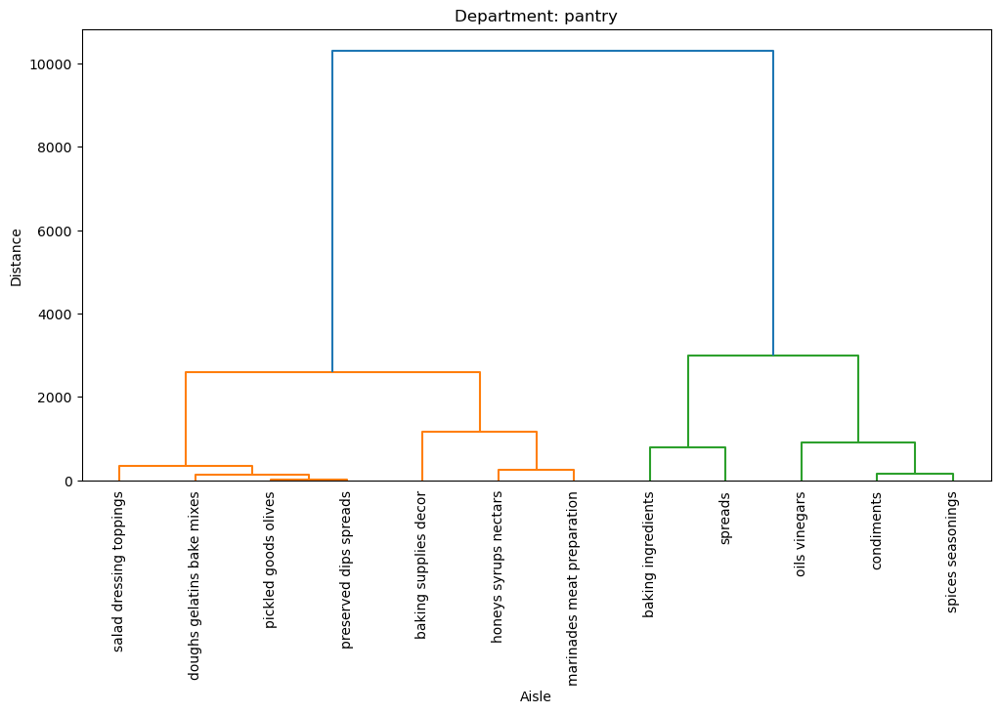

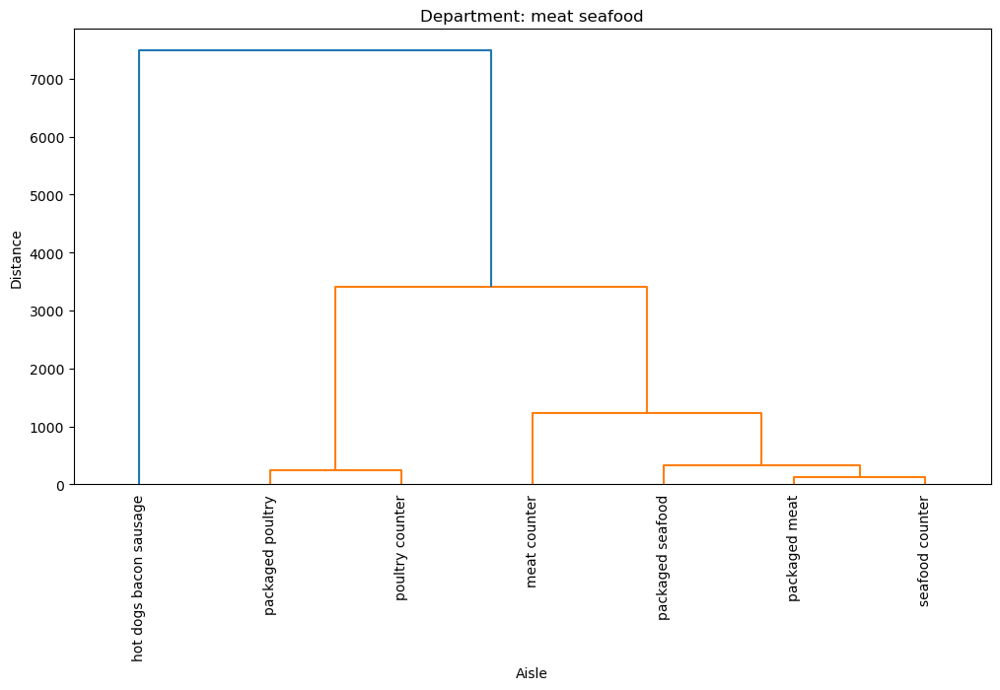

...

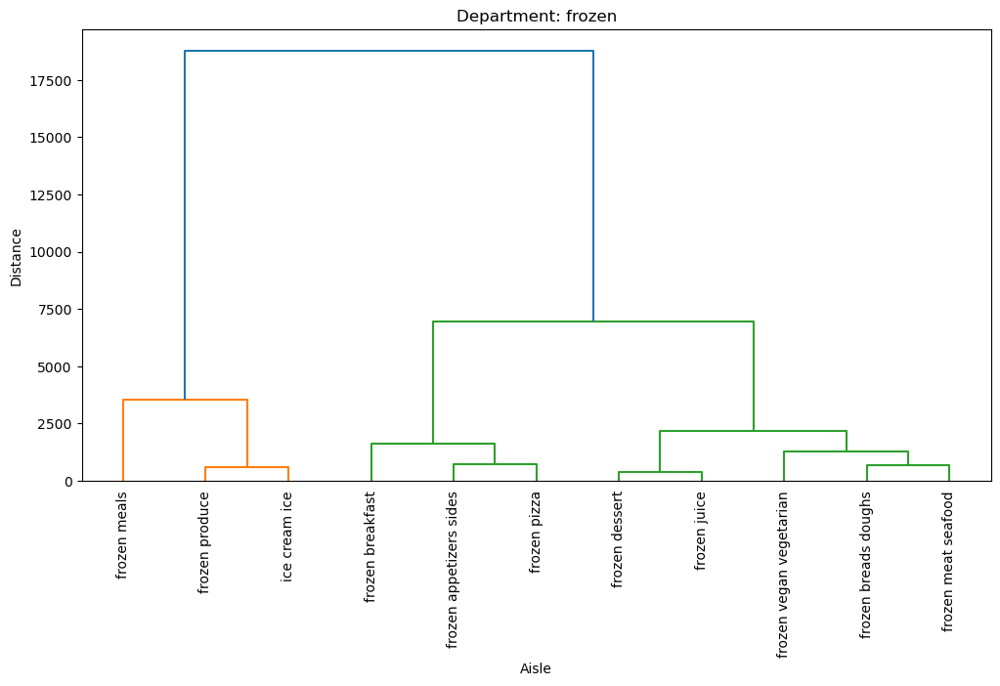

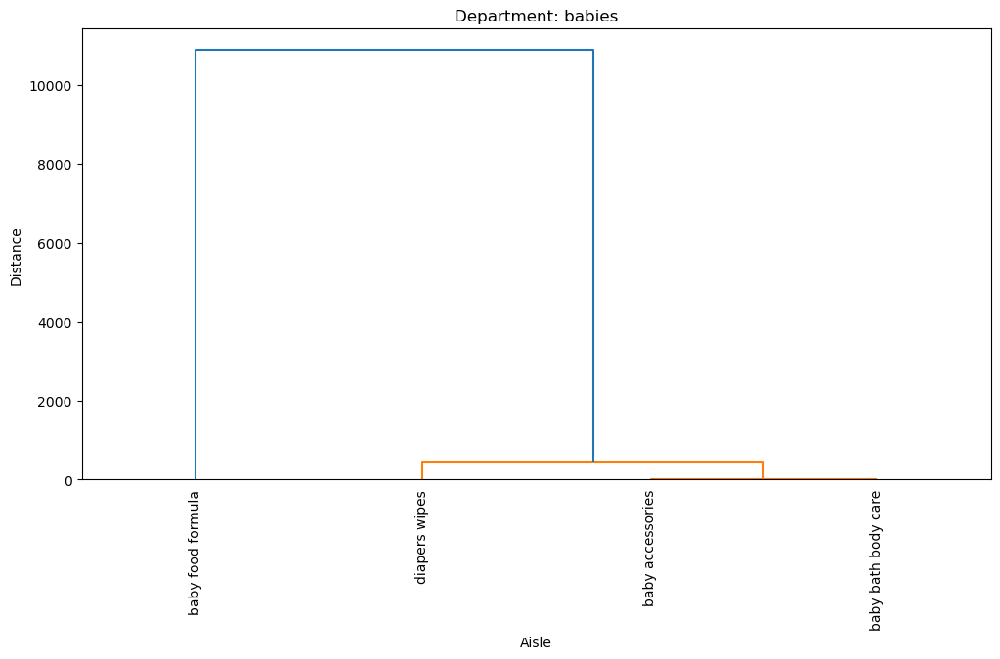

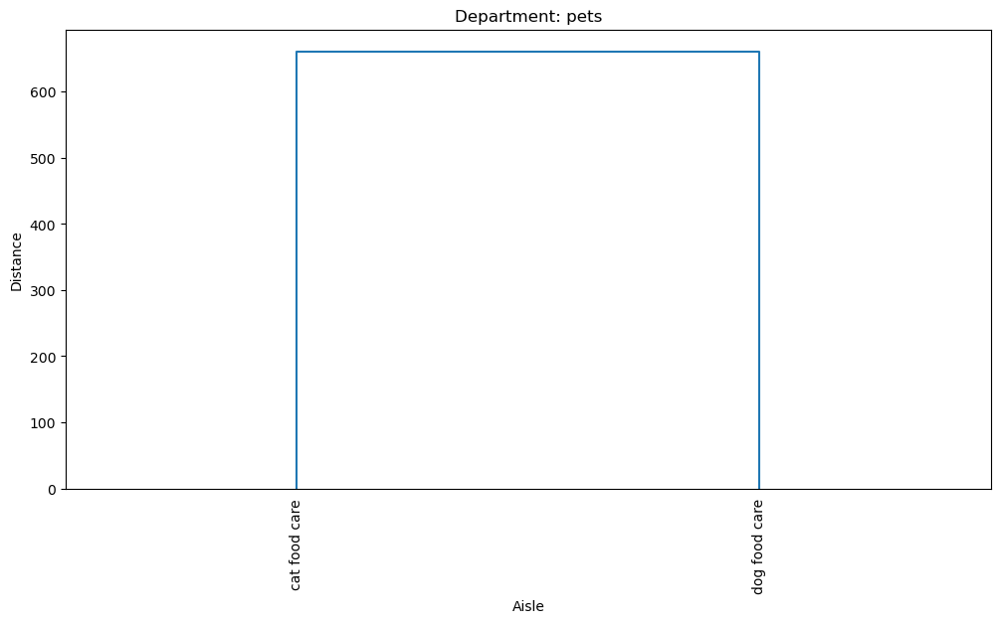

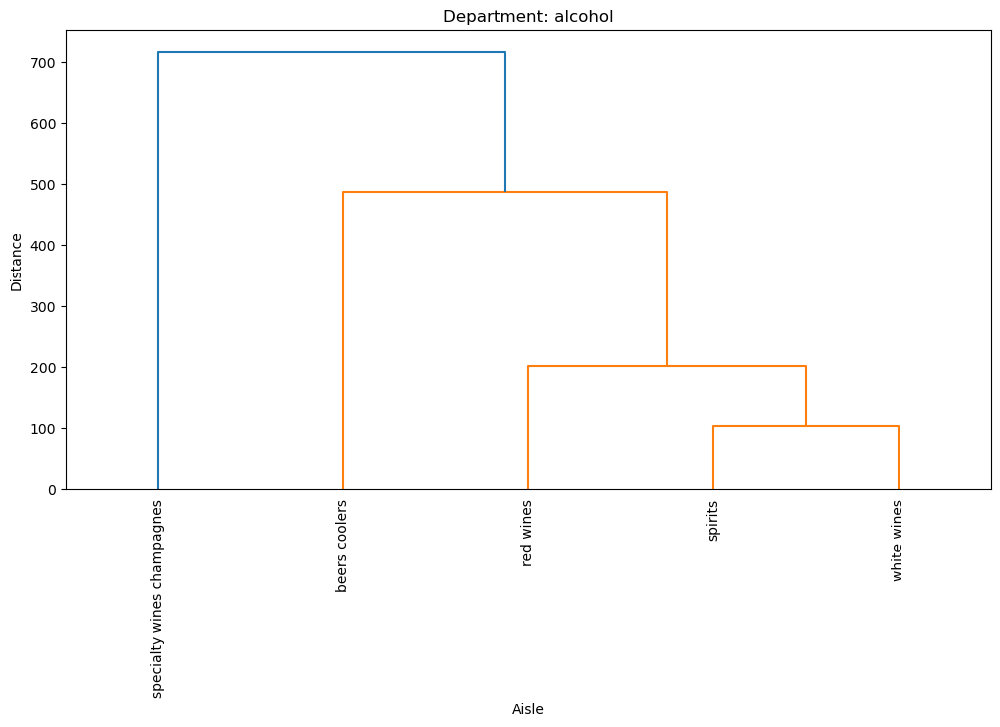

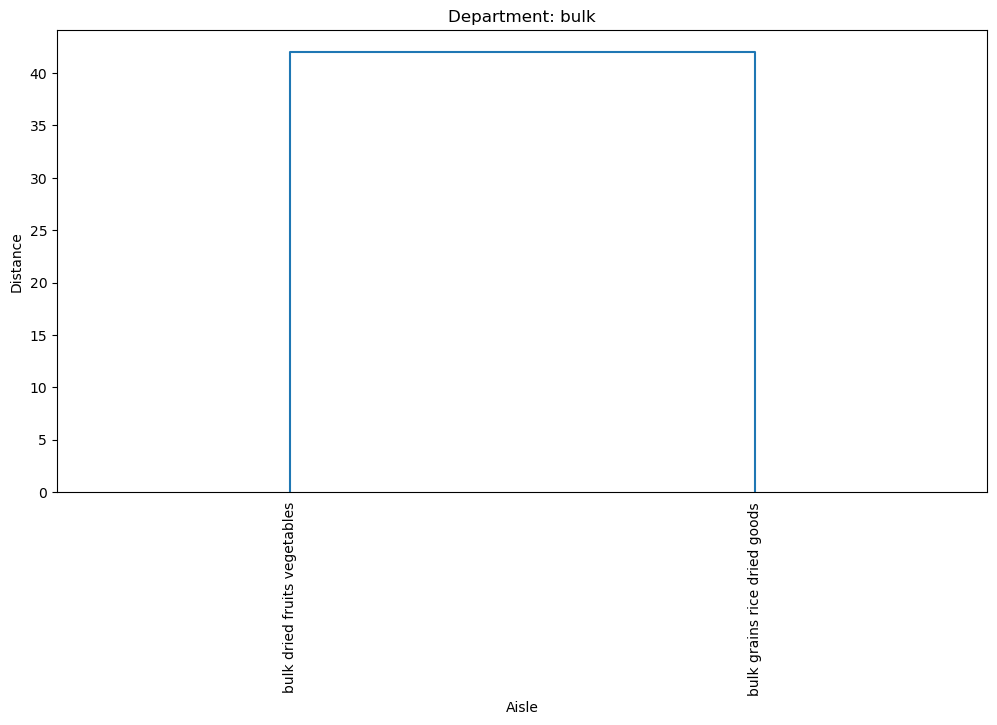

ValueError: The number of observations cannot be determined on an empty distance matrix.

In [29]:
# List of unique departments
unique_departments = df['department'].unique()

# Create separate dendrograms for each department
for department in unique_departments:
    # Filter data for the current department
    department_data = df[df['department'] == department]
    
    # Pivot the data to create a matrix with aisles as rows and sales as values
    sales_matrix = department_data.pivot_table(index='aisle', values='order_id', aggfunc='count', fill_value=0)
    
    # Perform hierarchical clustering
    linkage_matrix = linkage(sales_matrix.values, method='ward')
    
    # Create a dendrogram using matplotlib
    plt.figure(figsize=(12, 6))
    dendrogram(linkage_matrix, labels=sales_matrix.index, orientation='top', leaf_font_size=10)
    plt.title(f'Department: {department}')
    plt.xlabel('Aisle')
    plt.ylabel('Distance')
    plt.xticks(rotation=90)
    plt.show()

In [30]:
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# List of unique departments
unique_departments = df['department'].unique()

# Create a PDF file to save the graphs
pdf_file_path = 'department_graphs.pdf'
pdf_pages = PdfPages(pdf_file_path)

# Iterate through each department and create a graph
for department in unique_departments:
    # Filter data for the current department
    department_data = df[df['department'] == department]
    
    # Count the number of unique products in the department
    num_products = department_data['product_id'].nunique()
    
    # Group data by product_id and calculate sales (order count) for each product
    product_sales = department_data.groupby('product_id')['order_id'].nunique().reset_index()
    product_sales.columns = ['product_id', 'sales']
    
    # Sort products by sales in descending order
    product_sales = product_sales.sort_values(by='sales', ascending=False)
    
    # Create a bar chart for product sales
    plt.figure(figsize=(10, 5))
    sns.barplot(x='product_id', y='sales', data=product_sales)
    plt.title(f'Department: {department}')
    plt.xlabel('Product ID')
    plt.ylabel('Sales')
    plt.xticks(rotation=90)
    
    # Save the graph to the PDF file
    pdf_pages.savefig()
    plt.close()

    # Display the number of products in the department
    print(f"Number of Products in Department '{department}': {num_products}")
    
    # Display product details in the console
    print("\nProduct Details:")
    print(product_sales)
    print("\n" + "="*40 + "\n")  # Separator for better readability

# Close the PDF file
pdf_pages.close()

# Display a message once the PDF is created
print("PDF file 'department_graphs.pdf' has been created.")


C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'dairy eggs': 2800

Product Details:
      product_id  sales
1573       27845   3258
2776       49235   1923
1528       27086   1619
1229       22035   1386
2041       35951   1356
...          ...    ...
1794       31959      1
2461       44160      1
394         7153      1
840        15279      1
2004       35323      1

[2800 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'produce': 1403

Product Details:
      product_id  sales
714        24852  11623
393        13176   9335
617        21137   6466
640        21903   5947
1332       47209   5081
...          ...    ...
702        24244      1
697        24144      1
694        24048      1
672        23188      1
645        22088      1

[1403 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'canned goods': 1487

Product Details:
      product_id  sales
861        27156    932
1299       42768    734
904        28849    695
20           890    561
217         7021    429
...          ...    ...
174         5740      1
176         5758      1
445        14873      1
444        14839      1
347        11311      1

[1487 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'pantry': 3472

Product Details:
      product_id  sales
2161       31506   1194
2091       30450    532
1163       16953    500
3028       43713    431
1271       18441    406
...          ...    ...
2729       39575      1
2110       30732      1
760        11042      1
1462       21522      1
1797       26471      1

[3472 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'meat seafood': 667

Product Details:
     product_id  sales
332       25890   1224
523       38293    667
73         6046    545
632       47672    518
227       17461    444
..          ...    ...
519       38006      1
520       38046      1
267       20648      1
23         2503      1
22         2496      1

[667 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'bakery': 1159

Product Details:
      product_id  sales
102         5077   1454
409        18362    570
400        18027    441
475        21267    392
235        10673    384
...          ...    ...
726        31687      1
183         8740      1
1001       42960      1
313        14174      1
521        23278      1

[1159 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'beverages': 3089

Product Details:
      product_id  sales
2801       44632   1850
1266       19660   1312
2221       35221   1101
2091       33198   1053
10           196    904
...          ...    ...
2505       39490      1
2506       39531      1
2507       39536      1
2508       39567      1
1544       24194      1

[3089 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'snacks': 4416

Product Details:
      product_id  sales
1167       13870    573
2743       31040    427
3047       34448    414
1876       21376    376
3156       35561    351
...          ...    ...
2842       31998      1
3618       40658      1
289         3739      1
1574       18103      1
3777       42594      1

[4416 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'breakfast': 873

Product Details:
     product_id  sales
728       41844    645
781       44422    463
96         6187    400
332       20955    291
343       21543    239
..          ...    ...
437       26536      1
750       42621      1
753       42912      1
190       11179      1
111        6826      1

[873 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'personal care': 3226

Product Details:
      product_id  sales
776        12312    143
1794       27544    120
1895       29418    111
576         9047    103
2164       33493     99
...          ...    ...
2080       32084      1
2079       32076      1
2078       32075      1
2077       32056      1
1613       24912      1

[3226 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'household': 1875

Product Details:
      product_id  sales
348         8021    648
99          2086    441
1203       31066    296
556        13838    212
356         8230    181
...          ...    ...
603        14972      1
600        14812      1
1211       31314      1
1473       38575      1
1128       29110      1

[1875 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'dry goods pasta': 1306

Product Details:
      product_id  sales
591        23375    495
1058       39619    403
850        32734    400
277        12206    392
336        14197    303
...          ...    ...
670        26652      1
663        26281      1
661        26198      1
657        26039      1
1305       49648      1

[1306 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'deli': 1026

Product Details:
     product_id  sales
645       30489   1690
575       27344   1007
894       42585    746
494       22963    695
846       40310    449
..          ...    ...
697       33006      1
881       41821      1
221       10654      1
883       42167      1
761       36121      1

[1026 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'international': 722

Product Details:
     product_id  sales
552       36724    257
29         2450    242
334       22220    105
142       10492    102
588       39430    101
..          ...    ...
108        8014      1
450       29456      1
445       28943      1
111        8178      1
361       23143      1

[722 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'frozen': 2986

Product Details:
      product_id  sales
579         9076   1426
1268       20995    838
1480       24489    773
1099       17948    734
2814       46802    556
...          ...    ...
2122       35579      1
732        11680      1
1394       23061      1
724        11521      1
2625       43947      1

[2986 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'babies': 748

Product Details:
     product_id  sales
657       43875    211
514       34134    202
665       44471    156
50         3020    150
317       21162    148
..          ...    ...
225       15437      1
541       36250      1
223       15243      1
218       14944      1
0            15      1

[748 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'pets': 615

Product Details:
     product_id  sales
611       49355     39
97         7076     39
141       10863     34
209       16647     31
446       35956     28
..          ...    ...
429       34507      1
430       34667      1
431       34725      1
432       34822      1
307       24589      1

[615 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'alcohol': 564

Product Details:
     product_id  sales
28         2120    199
382       33065    149
429       38444    141
510       45190    140
521       46088    129
..          ...    ...
243       20231      1
242       20224      1
241       20214      1
239       20135      1
563       49606      1

[564 rows x 2 columns]


Number of Products in Department 'bulk': 32

Product Details:
    product_id  sales
2         5161    255
15       22260    157
16       22827     76
1         1000     67
26       43210     41
24       42091     33
23       40397     29
25       42134     23
5         7314     22
19       30365     19
7        10540     17
8        10915     16
28       45682     16
17       23038     13
3         6194     13
22       39653      8
27       43769      8
9        11325      6
29       46889      6
10       12699      4
30       47489      3
0          503      3
20       38007      3
14       19628      3
13       14985      

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version.

Number of Products in Department 'missing': 458

Product Details:
     product_id  sales
375       41149    188
348       38510     57
62         7035     53
144       14010     51
345       38452     47
..          ...    ...
34         3777      1
217       21915      1
216       21827      1
214       21649      1
0            38      1

[458 rows x 2 columns]




C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\madhu\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



Number of Products in Department 'other': 267

Product Details:
     product_id  sales
201       38662     98
144       26756     40
174       32115     28
208       39461     27
137       25554     16
..          ...    ...
170       31197      1
172       31803      1
17         3846      1
175       32805      1
82        15440      1

[267 rows x 2 columns]


PDF file 'department_graphs.pdf' has been created.


In [32]:
# Save the training data to a CSV file
train_set.to_csv('train_set.csv', index=False)

# Save the testing data to a CSV file
test_set.to_csv('test_set.csv', index=False)


In [33]:
mma_mart = pd.read_csv('mma_mart.csv')
# Create three separate DataFrames based on product names
refrigerated_products = mma_mart[mma_mart['product_name'].str.contains('refrigerated', case=False)]
frozen_products = mma_mart[mma_mart['product_name'].str.contains('frozen', case=False)]
other_products = mma_mart[~mma_mart['product_name'].str.contains('refrigerated|frozen', case=False)]

# Save each DataFrame to a CSV file
refrigerated_products.to_csv('refrigerated_products.csv', index=False)
frozen_products.to_csv('frozen_products.csv', index=False)
other_products.to_csv('other_products.csv', index=False)

In [34]:
department_product_aisle = mma_mart.groupby(['department', 'product_name', 'aisle']).size().reset_index()
department_product_aisle.columns = ['Department', 'Product', 'Aisle']

ValueError: Length mismatch: Expected axis has 4 elements, new values have 3 elements

In [35]:
department_product_aisle

,department,product_name,aisle,0
0,alcohol,101 Bourbon Whiskey,spirits,2
1,alcohol,12 Oz Beer,beers coolers,7
2,alcohol,12 Oz Lager,beers coolers,9
3,alcohol,12 Year Old Single Malt Scotch Speyside,spirits,6
4,alcohol,1500 Pale Ale,beers coolers,1
...,...,...,...,...
35065,snacks,with Xylitol Island Berry Lime 18 Sticks Sugar...,mint gum,2
35066,snacks,with Xylitol Minty Sweet Twist 18 Sticks Sugar...,mint gum,1
35067,snacks,with Xylitol Original Flavor 18 Sticks Sugar F...,mint gum,10
35068,snacks,with Xylitol Unwrapped Spearmint 50 Sticks Sug...,mint gum,3


In [36]:
unique_departments = mma_mart['department'].unique()

# Iterate through each unique department
for department in unique_departments:
    print(f"Department: {department}")
    
    # Filter data for the current department
    department_data = mma_mart[mma_mart['department'] == department]
    
    # Group the department data by 'product_name' and 'aisle' and list unique products and aisles
    product_aisle_info = department_data.groupby(['product_name', 'aisle']).size().reset_index()
    
    # Print the list of products and their respective aisles
    for _, row in product_aisle_info.iterrows():
        product_name = row['product_name']
        aisle = row['aisle']
        print(f"  Product: {product_name}, Aisle: {aisle}")
    
    print("=" * 40)  # Separator for better readability


Department: dairy eggs
  Product: 0% Fat Black Cherry Greek Yogurt y, Aisle: yogurt
  Product: 0% Fat Blueberry Greek Yogurt, Aisle: yogurt
  Product: 0% Fat Free Organic Milk, Aisle: milk
  Product: 0% Fat Greek Yogurt Black Cherry on the Bottom, Aisle: yogurt
  Product: 0% Fat Greek Yogurt Vanilla, Aisle: yogurt
  Product: 0% Fat Organic Greek Vanilla Yogurt, Aisle: yogurt
  Product: 0% Fat Peach Greek Yogurt, Aisle: yogurt
  Product: 0% Fat Strawberry Greek Yogurt, Aisle: yogurt
  Product: 0% Fat Superfruits Greek Yogurt, Aisle: yogurt
  Product: 0% Fat Vanilla Greek Yogurt, Aisle: yogurt
  Product: 0% Greek Strained Yogurt, Aisle: yogurt
  Product: 0% Greek Yogurt Black Cherry on the Bottom, Aisle: yogurt
  Product: 0% Greek, Blueberry on the Bottom Yogurt, Aisle: yogurt
  Product: 0% Milkfat Greek Plain Yogurt, Aisle: yogurt
  Product: 0% Milkfat Greek Yogurt Honey, Aisle: yogurt
  Product: 1 % Lowfat Milk, Aisle: milk
  Product: 1% Chocolate Milk, Aisle: milk
  Product: 1% Low Fa